## Steps to be done 
1. Data Sourcing
2. Data Cleaning
3. Data Manipulation
4. Data Analysis
5. Conclusion & Recommendations

#### importing required libraries

In [634]:
# required for plotting numerical data
import numpy as np
# required for plotting dataframe
import pandas as pd
# required for data plotting
import matplotlib.pyplot as plt
# required for data visualization
import seaborn as sns

#### ignore warnings

In [635]:
import warnings
warnings.filterwarnings('ignore')

#### reading the data from loan.csv file using pandas library

In [636]:
loan_data = pd.read_csv("loan.csv")

#### fetching top 5 values inorder to check if data is being loaded

In [637]:
loan_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


#### Loading basic information of dataframe

##### checking structure (number of rows and columns) of dataset

In [638]:
loan_data.shape

(39717, 111)

##### Getting information (columns, rows, datatypes and memory usage) of dataframe

In [639]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


##### Getting details of column in dataframe

In [640]:
loan_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)

#### Cleaning null value columns

In [641]:
# checking missing value column
null_columns=loan_data.isnull().sum()
null_columns

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

##### here we are not able to understand all null value columns so using below step to understand null columns greater than 0

In [642]:
columns_with_nulls = null_columns[null_columns > 0].index
columns_with_nulls

Index(['emp_title', 'emp_length', 'desc', 'title', 'mths_since_last_delinq',
       'mths_since_last_record', 'revol_util', 'last_pymnt_d', 'next_pymnt_d',
       'last_credit_pull_d', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'chargeoff_within_12_mths',
       'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op',
       'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc',
       'mths_since_recent_bc_dlq', 'mths_since_recent_inq',
       'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd',
       'num_actv_bc_tl', '

##### there are many columns having null values so checking columns with null values in percentage

In [643]:
(loan_data.isnull().sum()/loan_data.shape[0]*100).round(2).sort_values(ascending=False)

verification_status_joint    100.0
annual_inc_joint             100.0
mo_sin_old_rev_tl_op         100.0
mo_sin_old_il_acct           100.0
bc_util                      100.0
                             ...  
delinq_amnt                    0.0
policy_code                    0.0
earliest_cr_line               0.0
delinq_2yrs                    0.0
id                             0.0
Length: 111, dtype: float64

##### Eliminating columns that have 50% or more null values to reduce impact on analysis and improve accuracy of analysis

In [644]:
loan_data = loan_data.loc[:,loan_data.isnull().sum()/loan_data.shape[0]*100<50]
loan_data.shape

(39717, 54)

In [645]:
#checking remaining columns in dataframe
loan_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

#### Eliminating irrelevant columns

In [646]:
# Dropping zip_code as it is a masked data. Example: 604xx
loan_data=loan_data.drop(['zip_code'],axis=1)
# Dropping member_id as it is also a index column. We can use id column as index column instead of member_id.
loan_data=loan_data.drop(['member_id'],axis=1)
# Dropping random varaible columns. This has no significance in data analysis
loan_data=loan_data.drop(['title','emp_title','desc','url'],axis=1)

# Remaining columns are as follows
loan_data.shape

(39717, 48)

##### Eliminating columns that are calculated after loan is approved. As we need to find defaults this are not required columns. This are customer behaviour columns.

In [647]:
# Dropping customer behaviour columns
loan_data=loan_data.drop(['delinq_2yrs','earliest_cr_line','inq_last_6mths','open_acc','pub_rec','revol_bal','revol_util','total_acc','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d','application_type'],axis=1)
# Dropping funded_amnt_inv as it is committed by investors and has nothing to do with finding defaulters
loan_data=loan_data.drop(['funded_amnt_inv'],axis=1)

# Remaining columns are as follows
loan_data.shape

(39717, 26)

#### Checking columns having very few unique values

In [648]:
loan_data.nunique().sort_values(ascending=True)

tax_liens                         1
pymnt_plan                        1
collections_12_mths_ex_med        1
policy_code                       1
initial_list_status               1
chargeoff_within_12_mths          1
delinq_amnt                       1
acc_now_delinq                    1
term                              2
verification_status               3
pub_rec_bankruptcies              3
loan_status                       3
home_ownership                    5
grade                             7
emp_length                       11
purpose                          14
sub_grade                        35
addr_state                       50
issue_d                          55
int_rate                        371
loan_amnt                       885
funded_amnt                    1041
dti                            2868
annual_inc                     5318
installment                   15383
id                            39717
dtype: int64

##### dropping column with only one unique value as they wont have any impact on analysis

In [649]:
loan_data = loan_data.loc[:,loan_data.nunique()>1]

# Remaining columns are as follows
loan_data.shape

(39717, 18)

In [650]:
# checking columns in dataframe
loan_data.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'dti', 'pub_rec_bankruptcies'],
      dtype='object')

#### Checking for missing values

In [651]:
loan_data.isnull().sum().sort_values(ascending=False)

emp_length              1075
pub_rec_bankruptcies     697
annual_inc                 0
dti                        0
addr_state                 0
purpose                    0
loan_status                0
issue_d                    0
verification_status        0
id                         0
loan_amnt                  0
sub_grade                  0
grade                      0
installment                0
int_rate                   0
term                       0
funded_amnt                0
home_ownership             0
dtype: int64

#### Improvement is required for both emp_length and pub_rec_bankruptcies

##### checking for possibility to add null values for emp_length column

In [652]:
loan_data.emp_length.value_counts()

emp_length
10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: count, dtype: int64

##### emp_length column is not possible to be fixed based on the data displayed above
##### so we can remove rows which has null values for emp_length as they cant be used for analysis
##### dropna is dropping rows based on missing values in specific columns. If axis not mentioned by default axis used in drop is 0. 0 is for rows and 1 is for column.


In [653]:
loan_data = loan_data.dropna(subset=['emp_length'])
loan_data.shape

(38642, 18)

##### checking for possibility to add null values for pub_rec_bankruptcies column

In [654]:
loan_data.pub_rec_bankruptcies.value_counts()

pub_rec_bankruptcies
0.0    36375
1.0     1563
2.0        7
Name: count, dtype: int64

##### inserting 0 in place of null for pub_rec_bankruptcies column 

In [655]:
loan_data.pub_rec_bankruptcies.fillna(0,inplace=True)

##### Again checking for missing values across the dataframe

In [656]:
loan_data.isnull().sum()

id                      0
loan_amnt               0
funded_amnt             0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
addr_state              0
dti                     0
pub_rec_bankruptcies    0
dtype: int64

In [657]:
loan_data.shape

(38642, 18)

#### Removing duplicates rows in dataframe

In [658]:
loan_data = loan_data.drop_duplicates()
loan_data.shape

(38642, 18)

##### no duplicates so structure remains same

In [659]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38642 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    38642 non-null  int64  
 1   loan_amnt             38642 non-null  int64  
 2   funded_amnt           38642 non-null  int64  
 3   term                  38642 non-null  object 
 4   int_rate              38642 non-null  object 
 5   installment           38642 non-null  float64
 6   grade                 38642 non-null  object 
 7   sub_grade             38642 non-null  object 
 8   emp_length            38642 non-null  object 
 9   home_ownership        38642 non-null  object 
 10  annual_inc            38642 non-null  float64
 11  verification_status   38642 non-null  object 
 12  issue_d               38642 non-null  object 
 13  loan_status           38642 non-null  object 
 14  purpose               38642 non-null  object 
 15  addr_state            38

#### Correcting data types for objects. Converting objects to category to make graph plotting easier

In [660]:
loan_data.grade=loan_data.grade.astype('category')
loan_data.sub_grade=loan_data.sub_grade.astype('category')
loan_data.home_ownership=loan_data.home_ownership.astype('category')
loan_data.verification_status=loan_data.verification_status.astype('category')
loan_data.purpose=loan_data.purpose.astype('category')
loan_data.addr_state=loan_data.addr_state.astype('category')
#loan_data['loan_status'] = loan_data['loan_status'].astype('category') 
#loan_status as object to category conversion is creating issues in further analysis.

##### removing % symbol infront of int_rate and converting it to float value

In [661]:
loan_data.int_rate=loan_data.int_rate.apply(lambda x:str(x).replace('%','')).astype('float').round(2)

##### removing months word infront of term and converting it to string for further analysis

In [662]:
loan_data.term = loan_data.term.apply(lambda x: int(str(x).replace(' months', ''))).astype('int')

##### checking the values of emp_length column to check how it can be converted into

In [663]:
loan_data.emp_length.value_counts()

emp_length
10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: count, dtype: int64

##### replacing years, year, + with blanks and <1 to 0.5  and then converting everything to float which can help in further analysis

In [664]:
loan_data.emp_length = loan_data.emp_length.apply(
    lambda x: str(x).replace('years', '')
                  .replace('+', '')
                  .replace('< 1', '0.5')
                  .replace('year', '')
).astype('float').round(2)

In [665]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38642 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   id                    38642 non-null  int64   
 1   loan_amnt             38642 non-null  int64   
 2   funded_amnt           38642 non-null  int64   
 3   term                  38642 non-null  int32   
 4   int_rate              38642 non-null  float64 
 5   installment           38642 non-null  float64 
 6   grade                 38642 non-null  category
 7   sub_grade             38642 non-null  category
 8   emp_length            38642 non-null  float64 
 9   home_ownership        38642 non-null  category
 10  annual_inc            38642 non-null  float64 
 11  verification_status   38642 non-null  category
 12  issue_d               38642 non-null  object  
 13  loan_status           38642 non-null  object  
 14  purpose               38642 non-null  category
 15  addr_st

#### Deriving more columns for date month and year

In [666]:
loan_data.issue_d=pd.to_datetime(loan_data.issue_d,format='%b-%y')
loan_data['issue_year']=pd.to_datetime(loan_data.issue_d,format='%b-%y').dt.year
loan_data['issue_month']=pd.to_datetime(loan_data.issue_d,format='%b-%y').dt.month

In [667]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38642 entries, 0 to 39716
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    38642 non-null  int64         
 1   loan_amnt             38642 non-null  int64         
 2   funded_amnt           38642 non-null  int64         
 3   term                  38642 non-null  int32         
 4   int_rate              38642 non-null  float64       
 5   installment           38642 non-null  float64       
 6   grade                 38642 non-null  category      
 7   sub_grade             38642 non-null  category      
 8   emp_length            38642 non-null  float64       
 9   home_ownership        38642 non-null  category      
 10  annual_inc            38642 non-null  float64       
 11  verification_status   38642 non-null  category      
 12  issue_d               38642 non-null  datetime64[ns]
 13  loan_status          

In [668]:
loan_data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,pub_rec_bankruptcies,issue_year,issue_month
0,1077501,5000,5000,36,10.65,162.87,B,B2,10.0,RENT,24000.0,Verified,2011-12-01,Fully Paid,credit_card,AZ,27.65,0.0,2011,12
1,1077430,2500,2500,60,15.27,59.83,C,C4,0.5,RENT,30000.0,Source Verified,2011-12-01,Charged Off,car,GA,1.00,0.0,2011,12
2,1077175,2400,2400,36,15.96,84.33,C,C5,10.0,RENT,12252.0,Not Verified,2011-12-01,Fully Paid,small_business,IL,8.72,0.0,2011,12
3,1076863,10000,10000,36,13.49,339.31,C,C1,10.0,RENT,49200.0,Source Verified,2011-12-01,Fully Paid,other,CA,20.00,0.0,2011,12
4,1075358,3000,3000,60,12.69,67.79,B,B5,1.0,RENT,80000.0,Source Verified,2011-12-01,Current,other,OR,17.94,0.0,2011,12


In [669]:
loan_data.shape

(38642, 20)

In [670]:
loan_data.loan_status.value_counts()

loan_status
Fully Paid     32145
Charged Off     5399
Current         1098
Name: count, dtype: int64

#### Removing loans with status as 'Current'

In [671]:
loan_data = loan_data[loan_data.loan_status!='Current']

##### Shape of the dataframe after removing current rows

In [672]:
print(loan_data.shape)

(37544, 20)


In [673]:
loan_data.loan_status.value_counts()

loan_status
Fully Paid     32145
Charged Off     5399
Name: count, dtype: int64

In [674]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37544 entries, 0 to 39716
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    37544 non-null  int64         
 1   loan_amnt             37544 non-null  int64         
 2   funded_amnt           37544 non-null  int64         
 3   term                  37544 non-null  int32         
 4   int_rate              37544 non-null  float64       
 5   installment           37544 non-null  float64       
 6   grade                 37544 non-null  category      
 7   sub_grade             37544 non-null  category      
 8   emp_length            37544 non-null  float64       
 9   home_ownership        37544 non-null  category      
 10  annual_inc            37544 non-null  float64       
 11  verification_status   37544 non-null  category      
 12  issue_d               37544 non-null  datetime64[ns]
 13  loan_status          

#### installment, issue_d is not required for analysis

#### loan_amt and funded_amt seems to be having identical data so ignoring funded_amt column

In [675]:
loan_data = loan_data[['id','loan_amnt','term','int_rate','grade','sub_grade','emp_length','home_ownership','verification_status','annual_inc','loan_status','purpose','addr_state','dti','pub_rec_bankruptcies','issue_year','issue_month']]

##### Shape of the dataframe after removing columns

In [676]:
loan_data.shape

(37544, 17)

#### Checking and removing outliers if any

##### importing required library for plotting outliers

In [677]:
import plotly.express as px 

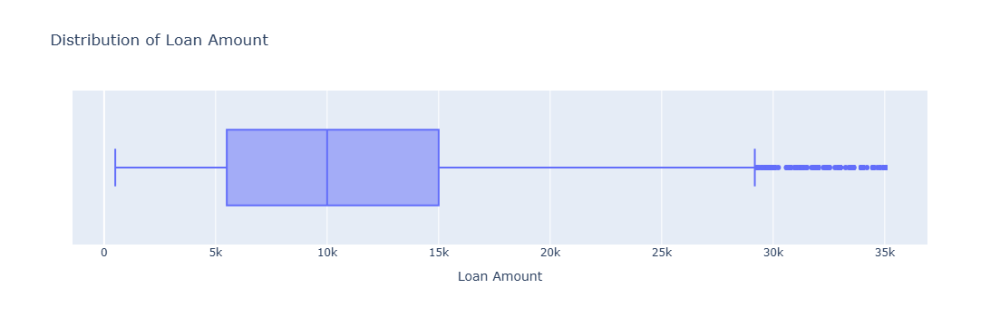

In [678]:
px.box(loan_data,x='loan_amnt',width=750,height=350,title='Distribution of Loan Amount',labels={'loan_amnt':'Loan Amount'}).show()

##### upper fence and max value are nearby so doesnt seem to have much impact

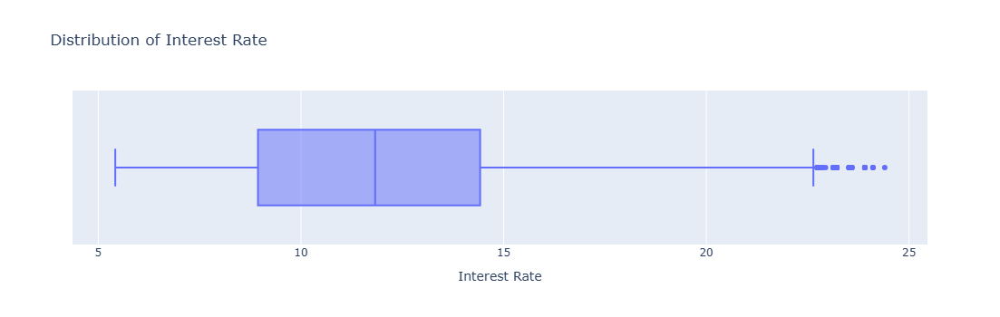

In [679]:
px.box(loan_data,x='int_rate',width=750,height=350,title='Distribution of Interest Rate',labels={'int_rate':'Interest Rate'}).show()

##### upper fence and max value are nearby so doesnt seem to have much impact

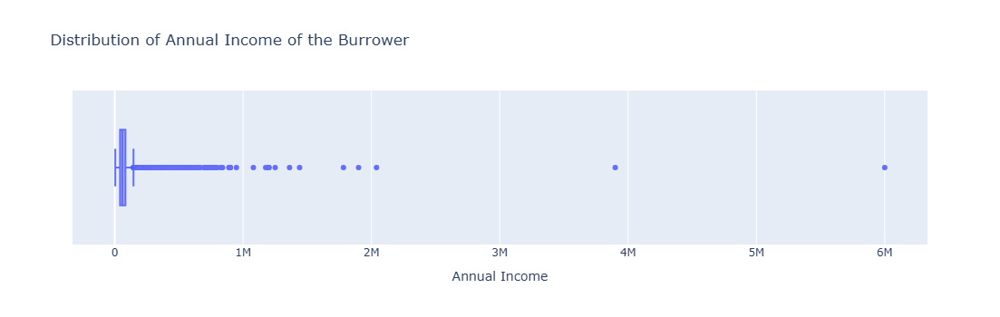

In [680]:
px.box(loan_data,x='annual_inc',width=750,height=350,title='Distribution of Annual Income of the Burrower',labels={'annual_inc':'Annual Income'}).show()

##### upper fence and max values are too far so we need to eliminate outliers in this case

#### Checking trend of values in annual_inc using line chart to find the appropriate quantile to use to remove outliers

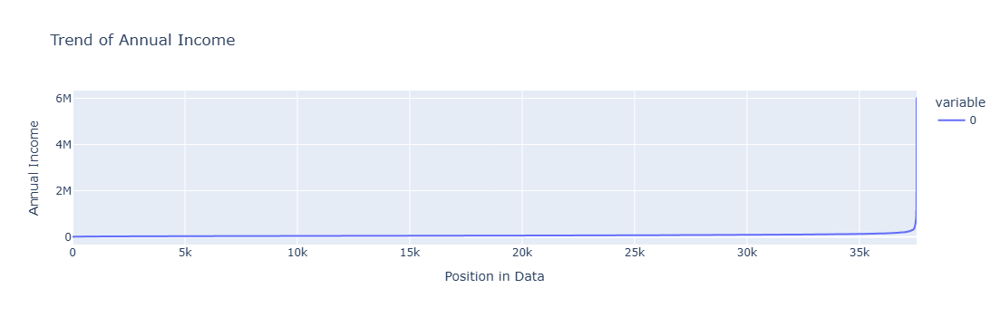

In [681]:
px.line(sorted(loan_data.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

##### As it can be observed from the line chart, the annual_inc is increasing in expontntial format around 99th percentile. Thus we can remove values greater than 99th percentile.

##### Removing outliers in annual_inc greater than 99th percentile

In [682]:
loan_data = loan_data[loan_data.annual_inc<=np.percentile(loan_data.annual_inc,99)]

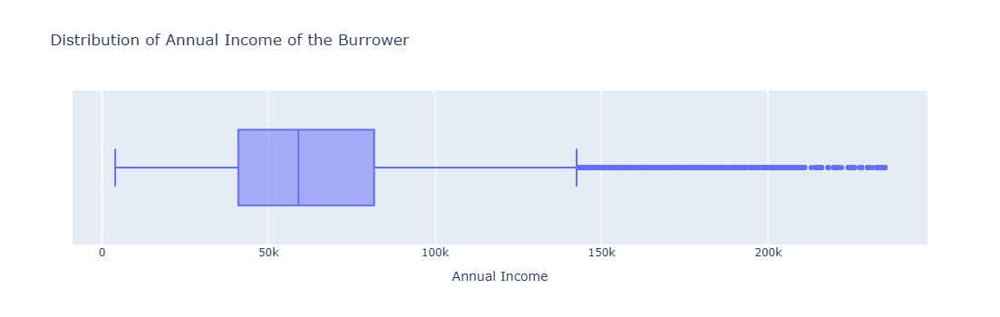

In [683]:
px.box(loan_data,x='annual_inc',width=750,height=350,title='Distribution of Annual Income of the Burrower',labels={'annual_inc':'Annual Income'}).show()

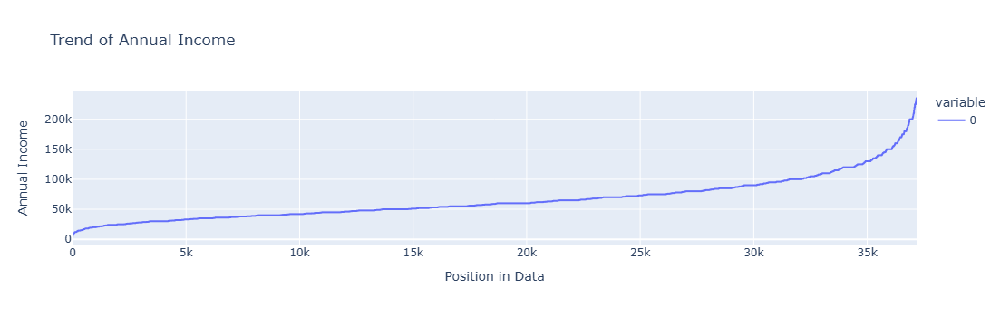

In [684]:
px.line(sorted(loan_data.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

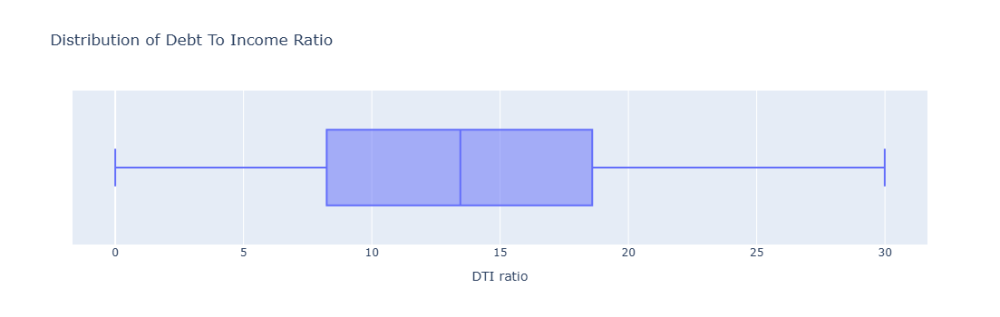

In [685]:
px.box(loan_data,x='dti',width=750,height=350,title='Distribution of Debt To Income Ratio',labels={'dti':'DTI ratio'}).show()

##### no outliers

### Data is cleaned now so moving ahead with analysis

## Univariate analysis

In [686]:
loan_data.loan_status.value_counts()*100/loan_data.loan_status.count()

loan_status
Fully Paid     85.580932
Charged Off    14.419068
Name: count, dtype: float64

In [687]:
loan_data.loan_status.value_counts()

loan_status
Fully Paid     31813
Charged Off     5360
Name: count, dtype: int64

In [688]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37173 entries, 0 to 39716
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   id                    37173 non-null  int64   
 1   loan_amnt             37173 non-null  int64   
 2   term                  37173 non-null  int32   
 3   int_rate              37173 non-null  float64 
 4   grade                 37173 non-null  category
 5   sub_grade             37173 non-null  category
 6   emp_length            37173 non-null  float64 
 7   home_ownership        37173 non-null  category
 8   verification_status   37173 non-null  category
 9   annual_inc            37173 non-null  float64 
 10  loan_status           37173 non-null  object  
 11  purpose               37173 non-null  category
 12  addr_state            37173 non-null  category
 13  dti                   37173 non-null  float64 
 14  pub_rec_bankruptcies  37173 non-null  float64 
 15  issue_y

### Loan status 

In [689]:
loan_data['loan_status'] = loan_data['loan_status'].astype('category')

In [690]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37173 entries, 0 to 39716
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   id                    37173 non-null  int64   
 1   loan_amnt             37173 non-null  int64   
 2   term                  37173 non-null  int32   
 3   int_rate              37173 non-null  float64 
 4   grade                 37173 non-null  category
 5   sub_grade             37173 non-null  category
 6   emp_length            37173 non-null  float64 
 7   home_ownership        37173 non-null  category
 8   verification_status   37173 non-null  category
 9   annual_inc            37173 non-null  float64 
 10  loan_status           37173 non-null  category
 11  purpose               37173 non-null  category
 12  addr_state            37173 non-null  category
 13  dti                   37173 non-null  float64 
 14  pub_rec_bankruptcies  37173 non-null  float64 
 15  issue_y

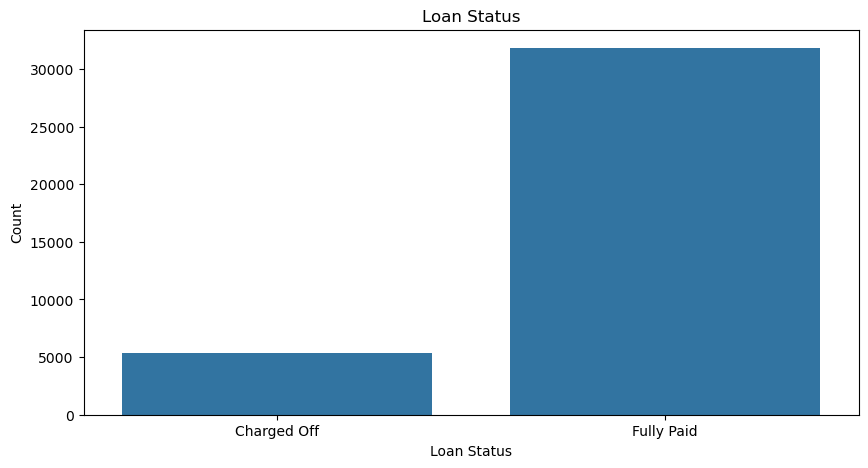

In [691]:
plt.figure(figsize=(10,5))
ax=sns.countplot(x='loan_status', data=loan_data)
ax.set_title('Loan Status')
ax.set_xlabel('Loan Status')
ax.set_ylabel('Count')
plt.show()

#### Inference - Defaulter loans are low in number compared to fully paid

### Loan Amount

In [692]:
print(loan_data.loan_amnt.describe())

count    37173.000000
mean     11034.824335
std       7272.289190
min        500.000000
25%       5400.000000
50%       9800.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


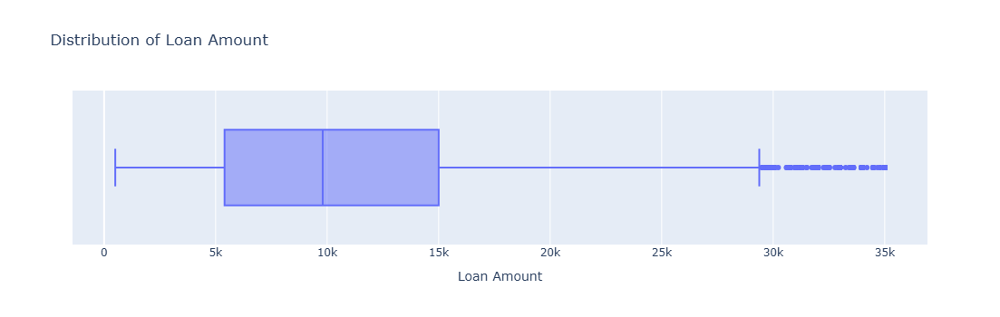

In [693]:
px.box(loan_data,x='loan_amnt',width=750,height=350,title='Distribution of Loan Amount',labels={'loan_amnt':'Loan Amount'}).show()

#### Inference - The loan amount varies from 500 to 35000 with a mean of 9800.

### Loan Term

In [694]:
loan_data.term.value_counts()*100/loan_data.term.count()

term
36    75.37729
60    24.62271
Name: count, dtype: float64

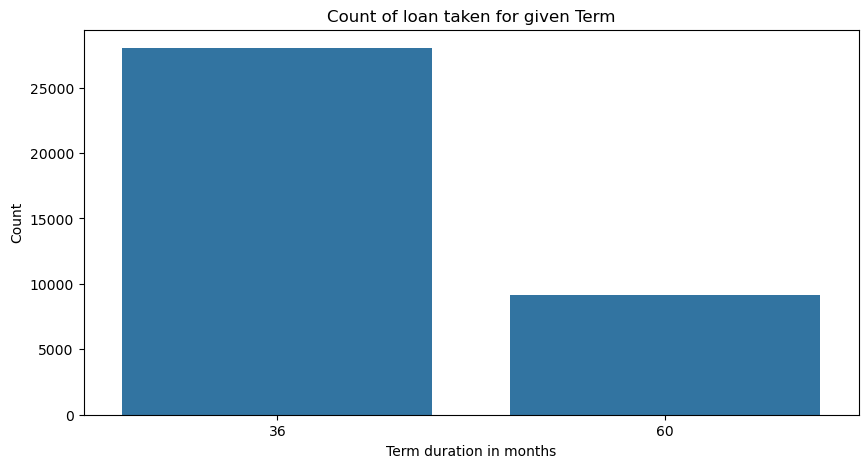

In [695]:
plt.figure(figsize=(10,5))
ax=sns.countplot(x='term', data=loan_data)
ax.set_title('Count of loan taken for given Term')
ax.set_xlabel('Term duration in months')
ax.set_ylabel('Count')
plt.show()

#### Inference- More people have taken loan for 36 months compared to 60 months

### Distribution of interest rate

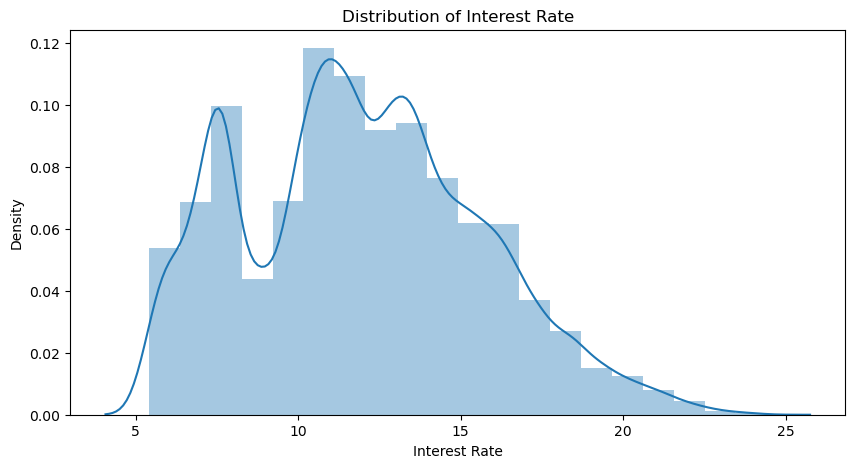

In [696]:
plt.figure(figsize=(10,5))
sns.distplot(sorted(loan_data.int_rate),kde=True,bins=20)
plt.xlabel('Interest Rate')
plt.ylabel('Density')
plt.title('Distribution of Interest Rate')
plt.show()

#### Inference - More people have taken loan around 10%-15% and 7.5% 

### Distribution of Grade

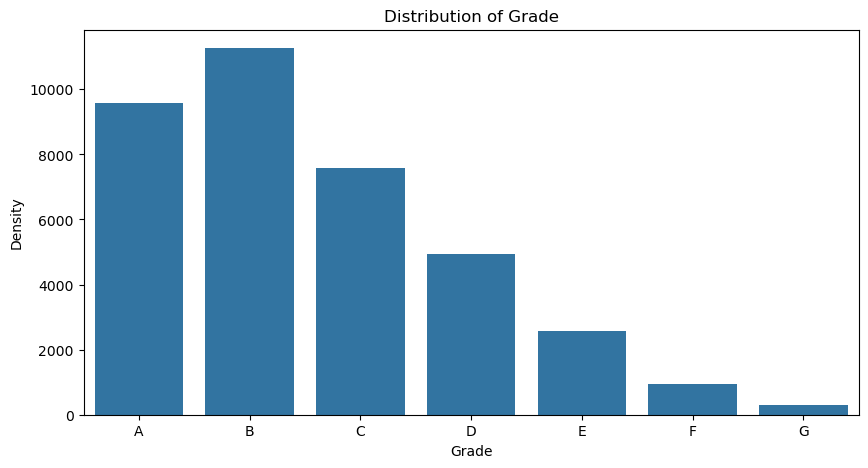

In [697]:
plt.figure(figsize=(10,5))
sns.countplot(x='grade', data=loan_data)
plt.xlabel('Grade')
plt.ylabel('Density')
plt.title('Distribution of Grade')
plt.show()

#### Inference- Large amount of loans has been taken by higher grade people. i.e Grade A and Grade B

### Distribution of Sub Grades

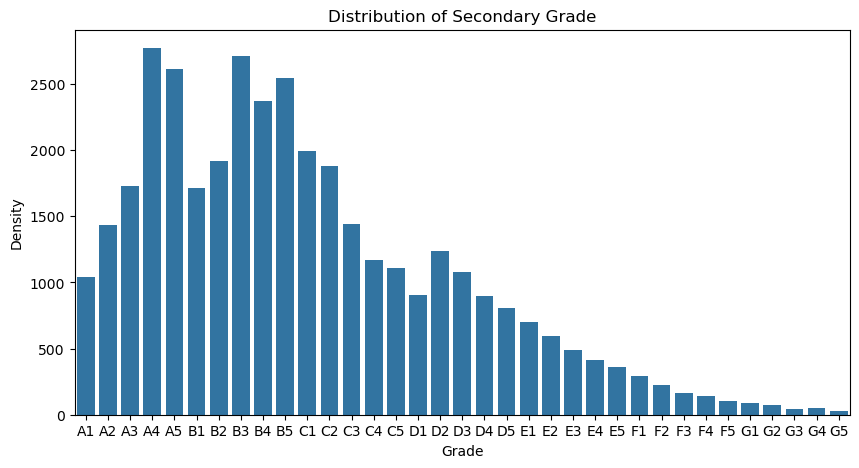

In [698]:
plt.figure(figsize=(10,5))
sns.countplot(x='sub_grade', data=loan_data)
plt.xlabel('Grade')
plt.ylabel('Density')
plt.title('Distribution of Secondary Grade')
plt.show()

#### Inference- Large amount of loans has been taken by A and B subgrade people. This analysis matches with the grade distribution

### Distribution of emp_length

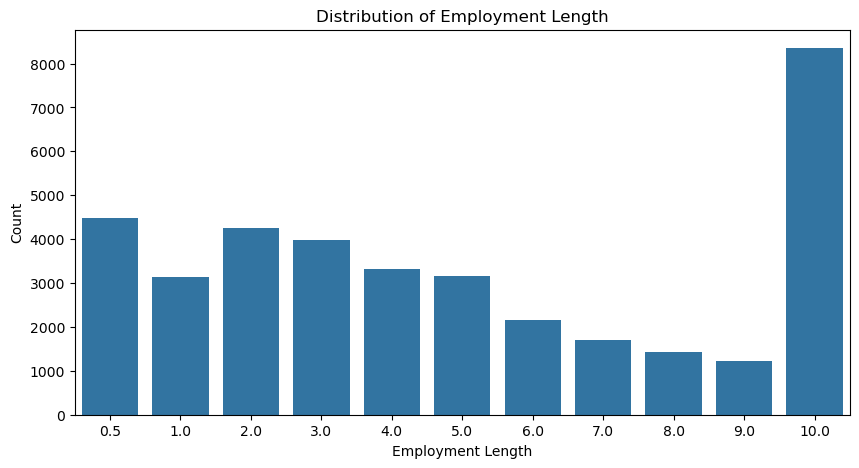

In [699]:
plt.figure(figsize=(10,5))
sns.countplot(x='emp_length', data=loan_data)
plt.xlabel('Employment Length')
plt.ylabel('Count')
plt.title('Distribution of Employment Length',fontsize=12)
plt.show()

#### Inference - More loans are taken by people having 10+ years of years

### Distribution of home_ownership

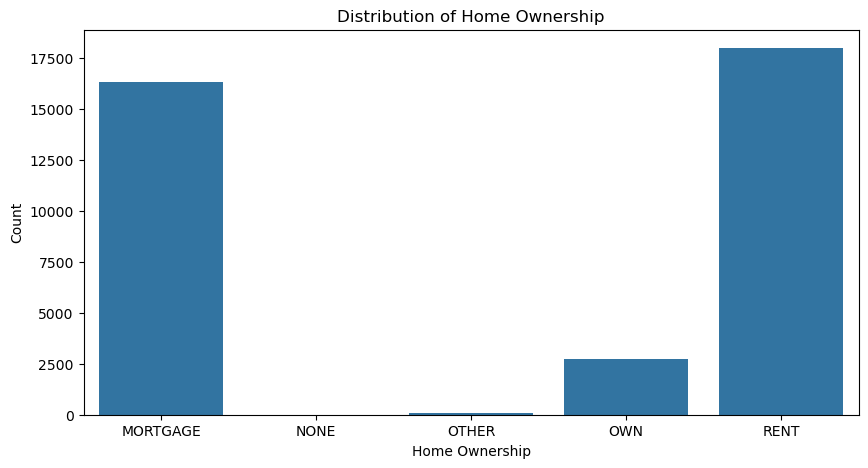

In [700]:
plt.figure(figsize=(10,5))
sns.countplot(x='home_ownership', data=loan_data)
plt.xlabel('Home Ownership')
plt.ylabel('Count')
plt.title('Distribution of Home Ownership',fontsize=12)
plt.show()

#### Inference - Loans are taken mostly for Rent and Morgage

### Distribution of verification_status

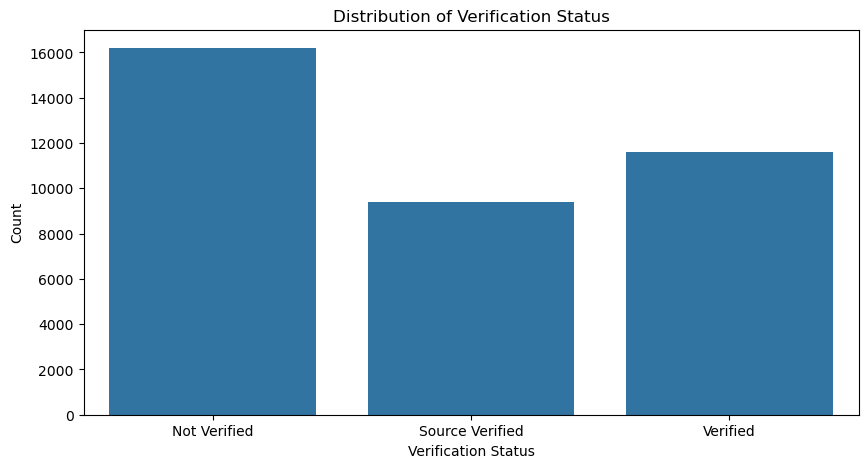

In [701]:
plt.figure(figsize=(10,5))
sns.countplot(x='verification_status', data=loan_data)
plt.xlabel('Verification Status')
plt.ylabel('Count')
plt.title('Distribution of Verification Status',fontsize=12)
plt.show()

#### Inference - Around 50% of people are verified or source verified

### Distribution of annual_inc

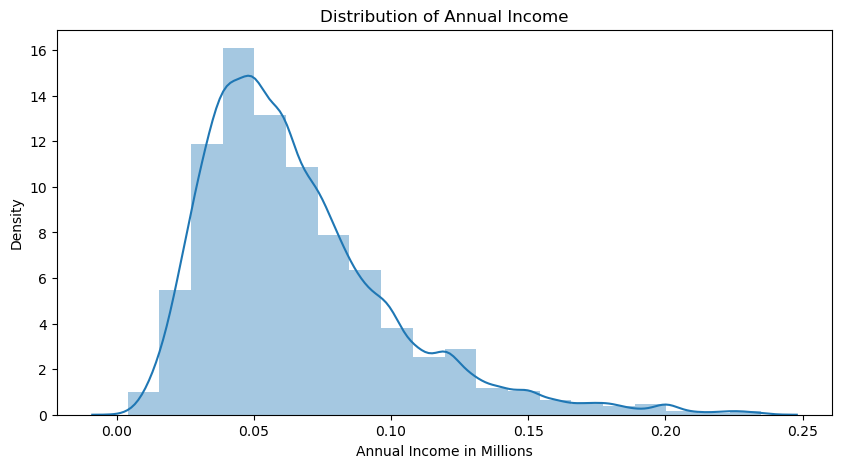

In [702]:
plt.figure(figsize=(10,5))
sns.distplot(loan_data.annual_inc/1000000,kde=True,bins=20)
plt.xlabel('Annual Income in Millions')
plt.ylabel('Density')
plt.title('Distribution of Annual Income',fontsize=12)
plt.show()

#### Inference - Annual income is left skewed so it is observed that majority of people have lower annual income

### Distribution of purpose

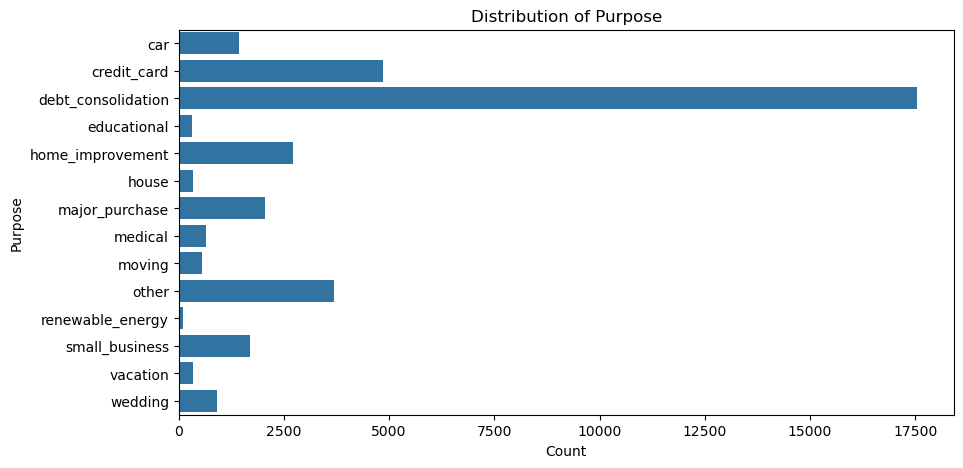

In [703]:
plt.figure(figsize=(10,5))
sns.countplot(y=loan_data.purpose)
plt.xlabel('Count')
plt.ylabel('Purpose')
plt.title('Distribution of Purpose',fontsize=12)
plt.show()

#### Inference - More loans are taken for debt consolidation followed by credit card

### Distribution of addr_state

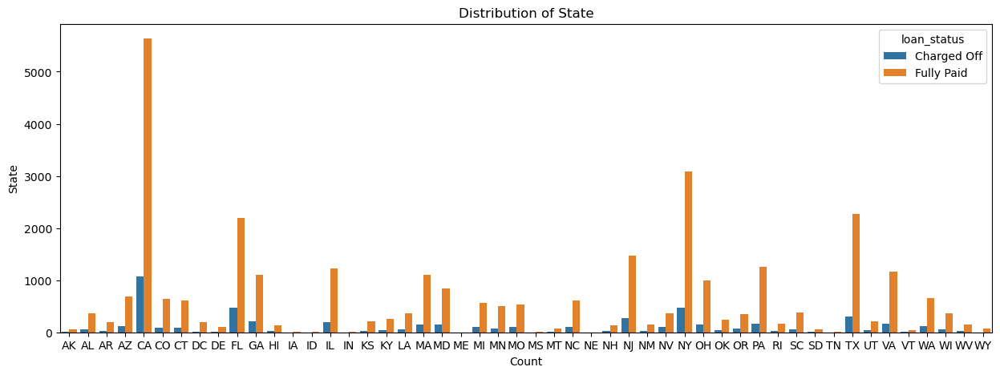

In [704]:
plt.figure(figsize=(15,5))
sns.countplot(x='addr_state', data=loan_data,hue=loan_data.loan_status)
plt.xlabel('Count')
plt.ylabel('State')
plt.title('Distribution of State',fontsize=12)
plt.show()

#### Inference - Majority of loan borrowers are from california, florida, new york, texas

### Distribution of DTI

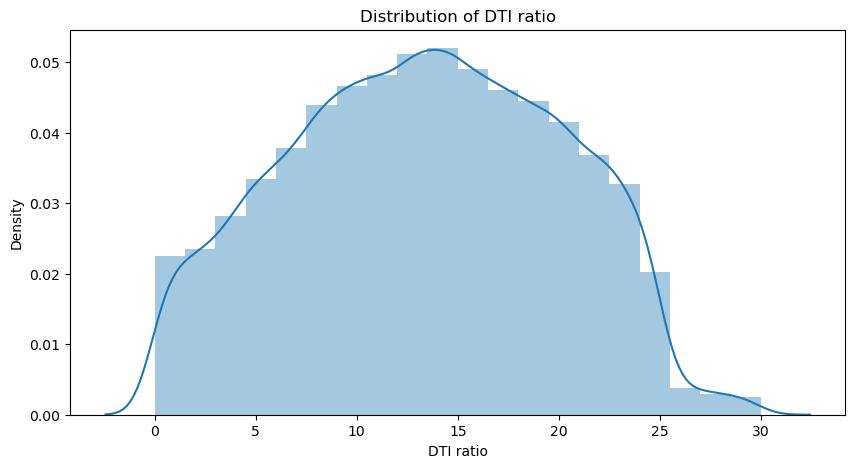

In [705]:
plt.figure(figsize=(10,5))
sns.distplot(loan_data.dti,kde=True,bins=20)
plt.xlabel('DTI ratio')
plt.ylabel('Density')
plt.title('Distribution of DTI ratio',fontsize=12)
plt.show()

#### Inference - More borrowers have high level of debt to income ratio clustered within the 10-20 ratio range

### Distribution of pub_rec_bankruptcies

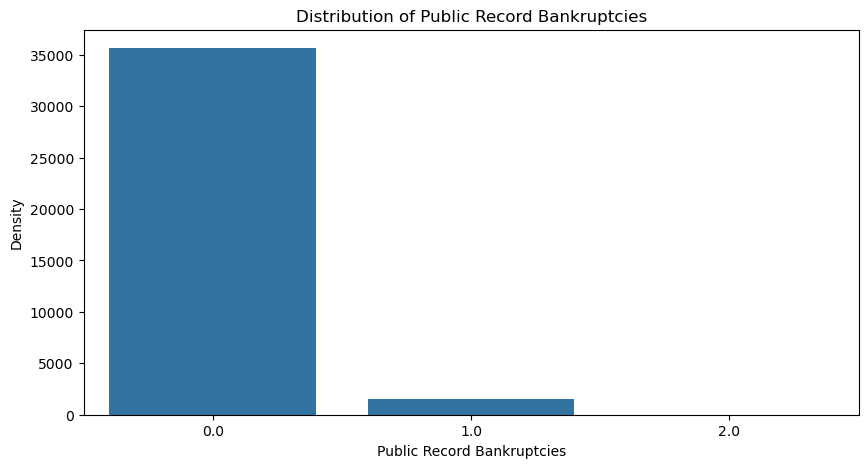

In [706]:
plt.figure(figsize=(10,5))
sns.countplot(x="pub_rec_bankruptcies", data=loan_data)
plt.xlabel('Public Record Bankruptcies')
plt.ylabel('Density')
plt.title('Distribution of Public Record Bankruptcies',fontsize=12)
plt.show()

#### Inference - Most of the borrowers dont have any record of Public Record Bankruptcies

### Distribution of issue_month

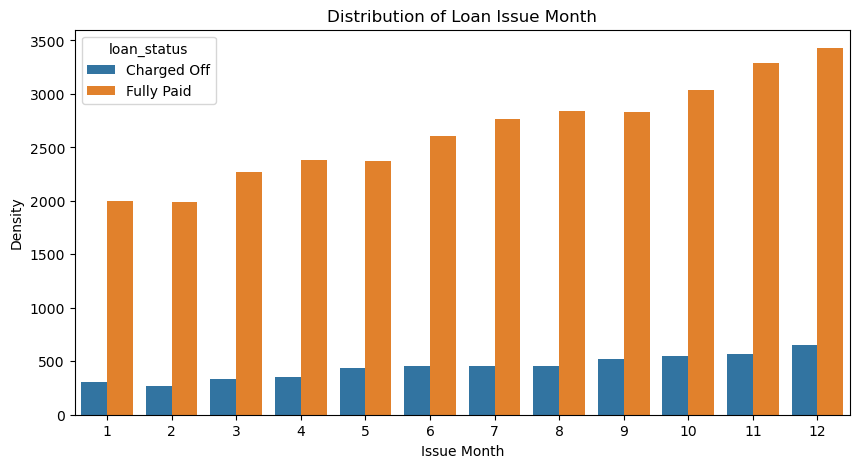

In [707]:
plt.figure(figsize=(10,5))
sns.countplot(x="issue_month", data=loan_data, hue=loan_data.loan_status)
plt.xlabel('Issue Month')
plt.ylabel('Density')
plt.title('Distribution of Loan Issue Month',fontsize=12)
plt.show()

#### Inference - More loans were given in the last quarter of year

### Distribution of issue_year


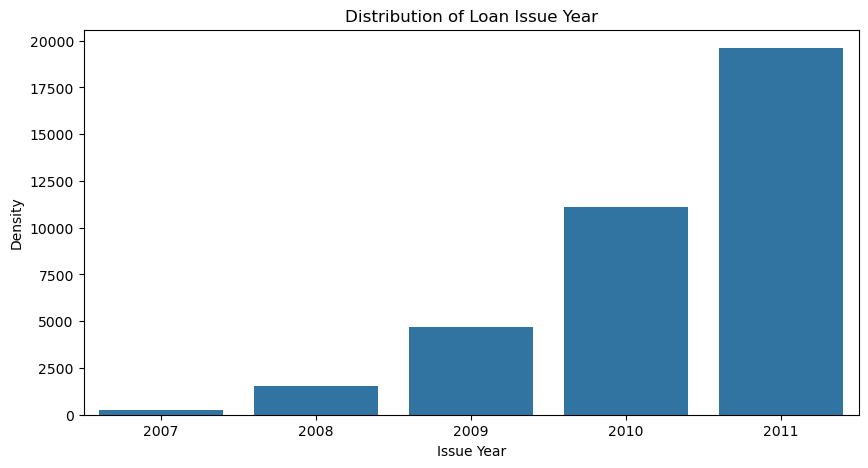

In [708]:
plt.figure(figsize=(10,5))
sns.countplot(x="issue_year", data=loan_data)
plt.xlabel('Issue Year')
plt.ylabel('Density')
plt.title('Distribution of Loan Issue Year',fontsize=12)
plt.show()

#### Inference - Number of loan approvals increases with time

## Segmented Univariate analysis

### Distribution of purpose based on loan_status


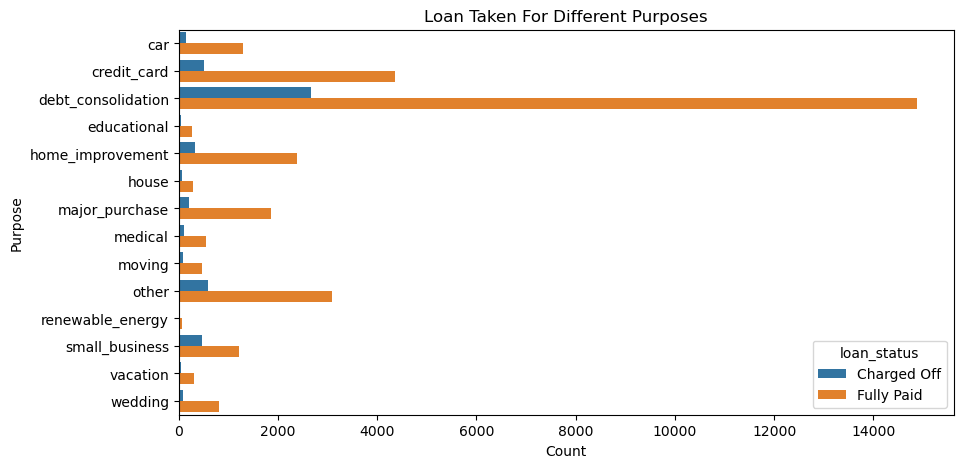

In [709]:
plt.figure(figsize=(10,5))
sns.countplot(data=loan_data,y='purpose',hue='loan_status')
plt.xlabel('Count')
plt.ylabel('Purpose')
plt.title('Loan Taken For Different Purposes',fontsize=12)
plt.show()

#### Inference - Debt Consolidation is the most popular purpose for loan taken and it also has high number of people paying loans as well as defaulted

### Distribution of loan_amnt based on loan_status


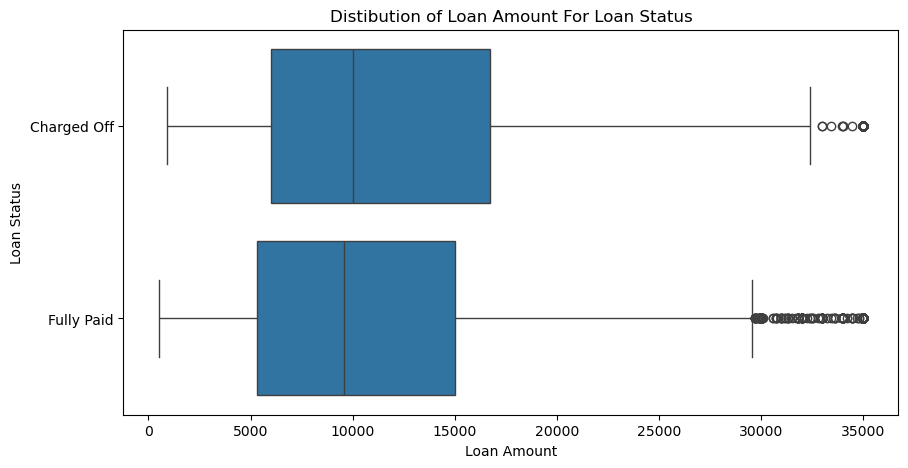

In [710]:
plt.figure(figsize=(10,5))
sns.boxplot(data=loan_data,x='loan_amnt',y='loan_status')
plt.xlabel('Loan Amount')
plt.ylabel('Loan Status')
plt.title('Distibution of Loan Amount For Loan Status',fontsize=12)
plt.show()

#### Inference - It is observed that 75% percentile is more in defaulted loans and so we can say that large amount of loans has higher chances of defaulting

### Distribution of Term based on loan_status


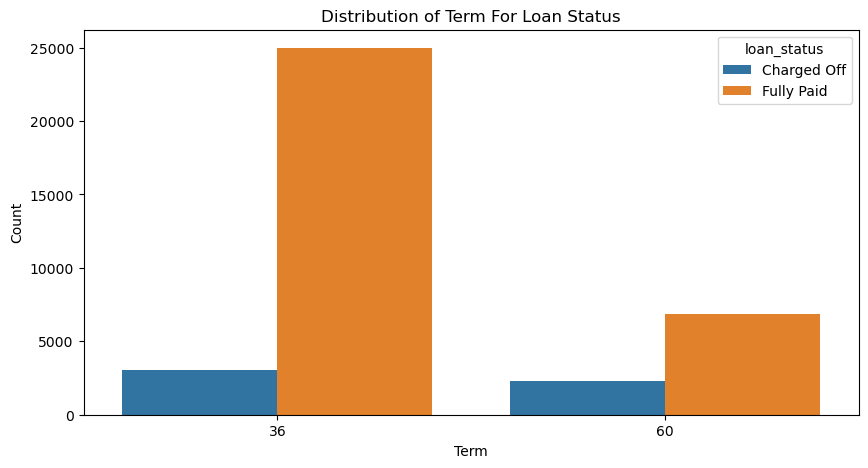

In [711]:
plt.figure(figsize=(10,5))
sns.countplot(data=loan_data,x='term',hue='loan_status')
plt.xlabel('Term')
plt.ylabel('Count')
plt.title('Distribution of Term For Loan Status',fontsize=12)
plt.show()

#### Inference - People who have taken loans for less duration i.e 36 months have paid the loan amount in time.

### Distribution of Term based on Grade

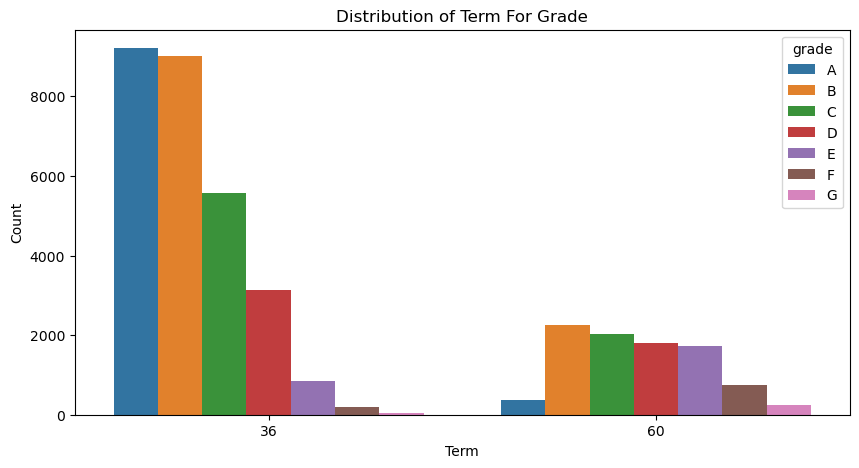

In [712]:
plt.figure(figsize=(10,5))
sns.countplot(data=loan_data,x='term',hue='grade')
plt.xlabel('Term')
plt.ylabel('Count')
plt.title('Distribution of Term For Grade',fontsize=12)
plt.show()

#### Inference - People who have taken loans for less duration i.e 36 months are the people with higher grades like A and B

### Distribution of DTI based on Grade


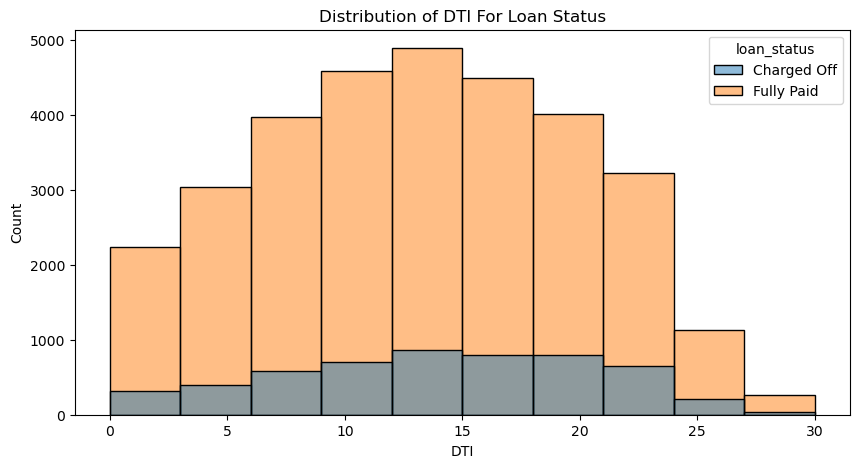

In [713]:
plt.figure(figsize=(10,5))
sns.histplot(data=loan_data,x='dti',hue='loan_status',bins=10)
plt.xlabel('DTI')
plt.ylabel('Count')
plt.title('Distribution of DTI For Loan Status',fontsize=12)
plt.show()

#### Inference - Most borrowers fall within the 10-20 DTI range, and while higher DTIs are present, they don't show a significant increase in loan defaults.

### Distribution of house_ownership based on loan_status


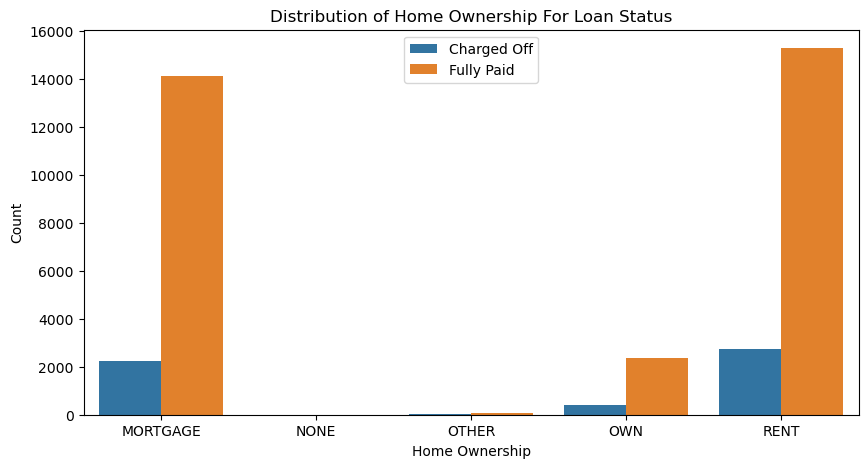

In [714]:
plt.figure(figsize=(10,5))
sns.countplot(data=loan_data,x='home_ownership',hue='loan_status')
plt.xlabel('Home Ownership')
plt.ylabel('Count')
plt.title('Distribution of Home Ownership For Loan Status',fontsize=12)
plt.legend(loc='upper center')
plt.show()

#### Inference - Most borrowers who either morgage a home or rent have fully paid their loans and the defaulted numbers remains same for morgage as well as rented people

### Distribution of annual_inc based on loan_status


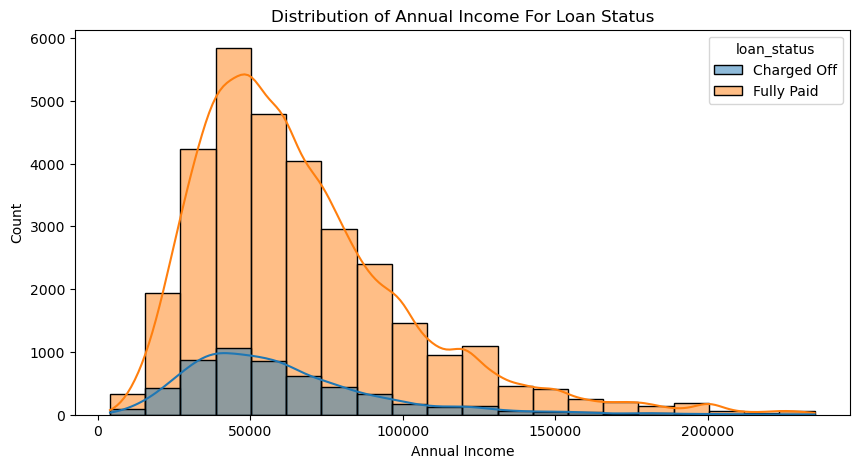

In [715]:
plt.figure(figsize=(10,5))
sns.histplot(data=loan_data,x='annual_inc',hue='loan_status',bins=20,kde=True)
plt.xlabel('Annual Income')
plt.ylabel('Count')
plt.title('Distribution of Annual Income For Loan Status',fontsize=12)
plt.show()

#### Inference - Borrowers with annual income around 50k are more likely to default the loans compared to higher income people

### Distribution of loan_status based on issue_year


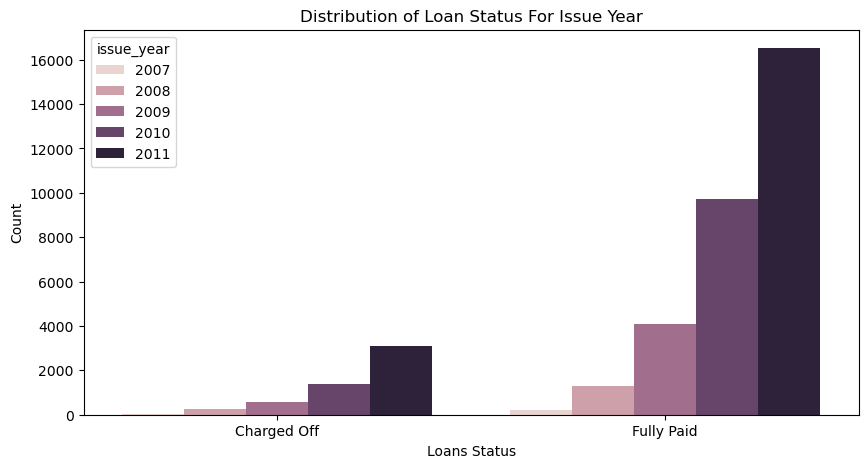

In [716]:
plt.figure(figsize=(10,5))
sns.countplot(x='loan_status', data=loan_data ,hue='issue_year')
plt.xlabel('Loans Status')
plt.ylabel('Count')
plt.title('Distribution of Loan Status For Issue Year',fontsize=12)
plt.show()

#### Inference - Fully paid loans are increasing with time compared to defaulted loans

### Distribution of int_amnt based on loan_status

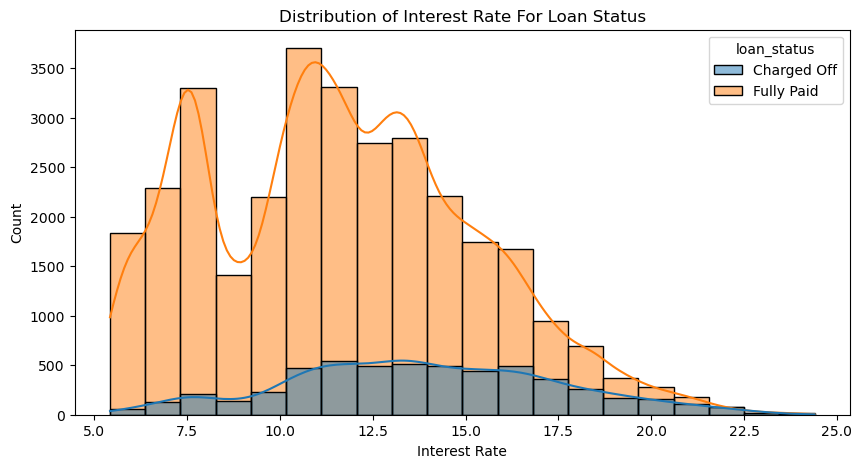

In [717]:
plt.figure(figsize=(10,5))
sns.histplot(data=loan_data,x='int_rate',hue='loan_status', bins=20, kde=True)
plt.xlabel('Interest Rate')
plt.ylabel('Count')
plt.title('Distribution of Interest Rate For Loan Status',fontsize=12)
plt.show()

#### Inference - Defaulted loans are most common within the 5%-15% interest rate range, peaking around 8%, and then gradually decreasing as the interest rate rises beyond 17.5%.

### Distribution of emp_length based on loan_status

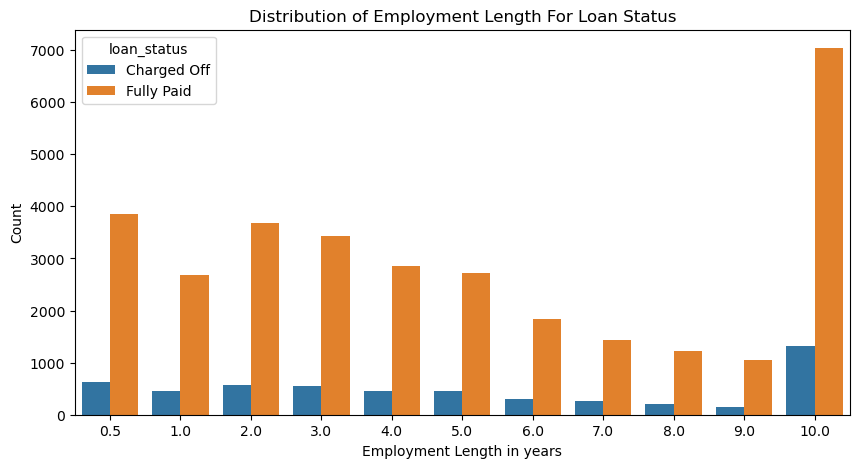

In [718]:
plt.figure(figsize=(10,5))
sns.countplot(data=loan_data,x='emp_length',hue='loan_status')
plt.xlabel('Employment Length in years')
plt.ylabel('Count')
plt.title('Distribution of Employment Length For Loan Status',fontsize=12)
plt.show()

#### Inference - The Employees with 10+ years of experience are likely to default and have higher chance of fully paying the loan.

## Bivariate Analysis

### Comparison of interest rate based on grade

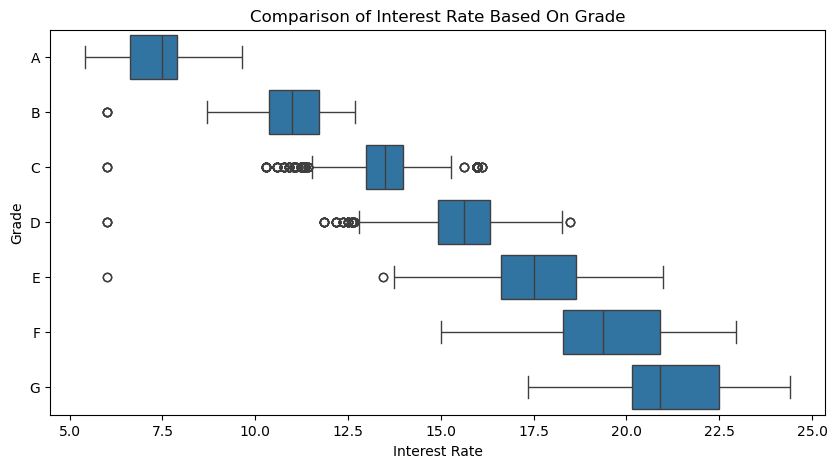

In [719]:
plt.figure(figsize=(10,5))
sns.boxplot(data=loan_data,x='int_rate',y='grade')
plt.xlabel('Interest Rate')
plt.ylabel('Grade')
plt.title('Comparison of Interest Rate Based On Grade',fontsize=12)
plt.show()

#### Inference - Higher grades (A, B, C) are associated with lower interest rates, while lower grades (D, E, F, G) correspond to higher interest rates.

### Comparison of DTI over grade for loan status


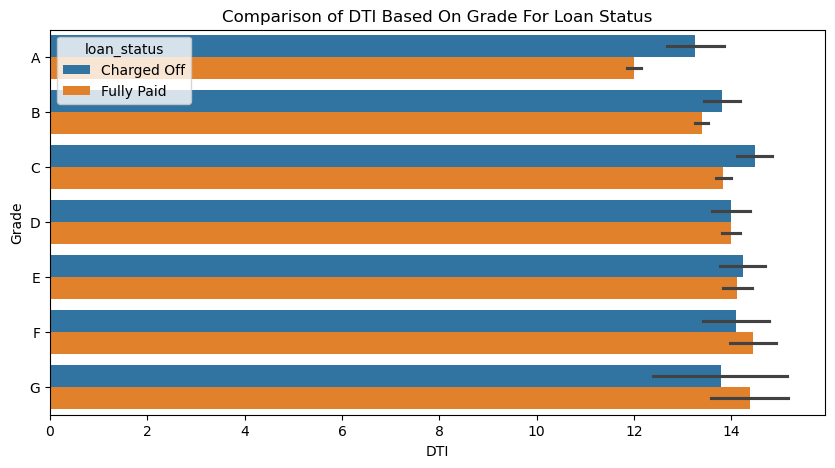

In [720]:
plt.figure(figsize=(10,5))
sns.barplot(data=loan_data,x='dti',y='grade',hue='loan_status')
plt.xlabel('DTI')
plt.ylabel('Grade')
plt.title('Comparison of DTI Based On Grade For Loan Status',fontsize=12)
plt.show()

#### Inference - not able to find a proper inference here

### Comparison of annual income to public record bankruptcy over loan status


<Figure size 1000x500 with 0 Axes>

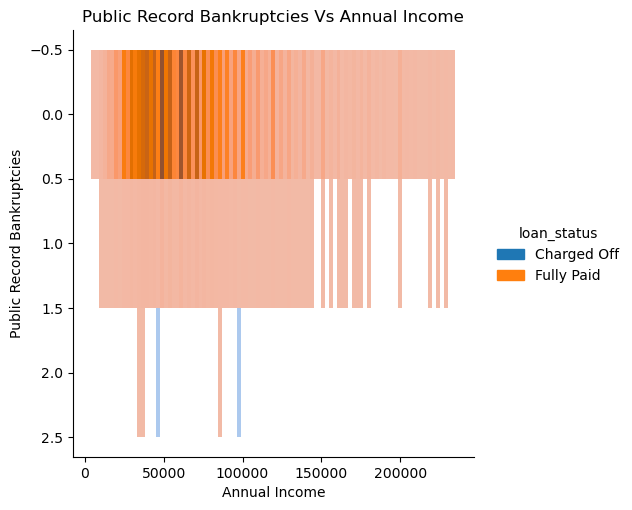

In [721]:
plt.figure(figsize=(10,5))
sns.displot(y=loan_data.pub_rec_bankruptcies.astype('category'),x=loan_data.annual_inc,hue=loan_data.loan_status)
plt.xlabel('Annual Income')
plt.ylabel('Public Record Bankruptcies')
plt.title('Public Record Bankruptcies Vs Annual Income',fontsize=12)
plt.show()

#### Inference - Most of the borrowers have no public record of bankruptcies and so we can give loan safely.

## Multivariate analysis

In [722]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37173 entries, 0 to 39716
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   id                    37173 non-null  int64   
 1   loan_amnt             37173 non-null  int64   
 2   term                  37173 non-null  int32   
 3   int_rate              37173 non-null  float64 
 4   grade                 37173 non-null  category
 5   sub_grade             37173 non-null  category
 6   emp_length            37173 non-null  float64 
 7   home_ownership        37173 non-null  category
 8   verification_status   37173 non-null  category
 9   annual_inc            37173 non-null  float64 
 10  loan_status           37173 non-null  category
 11  purpose               37173 non-null  category
 12  addr_state            37173 non-null  category
 13  dti                   37173 non-null  float64 
 14  pub_rec_bankruptcies  37173 non-null  float64 
 15  issue_y

### Plotting the heatmap to find correlation between variables

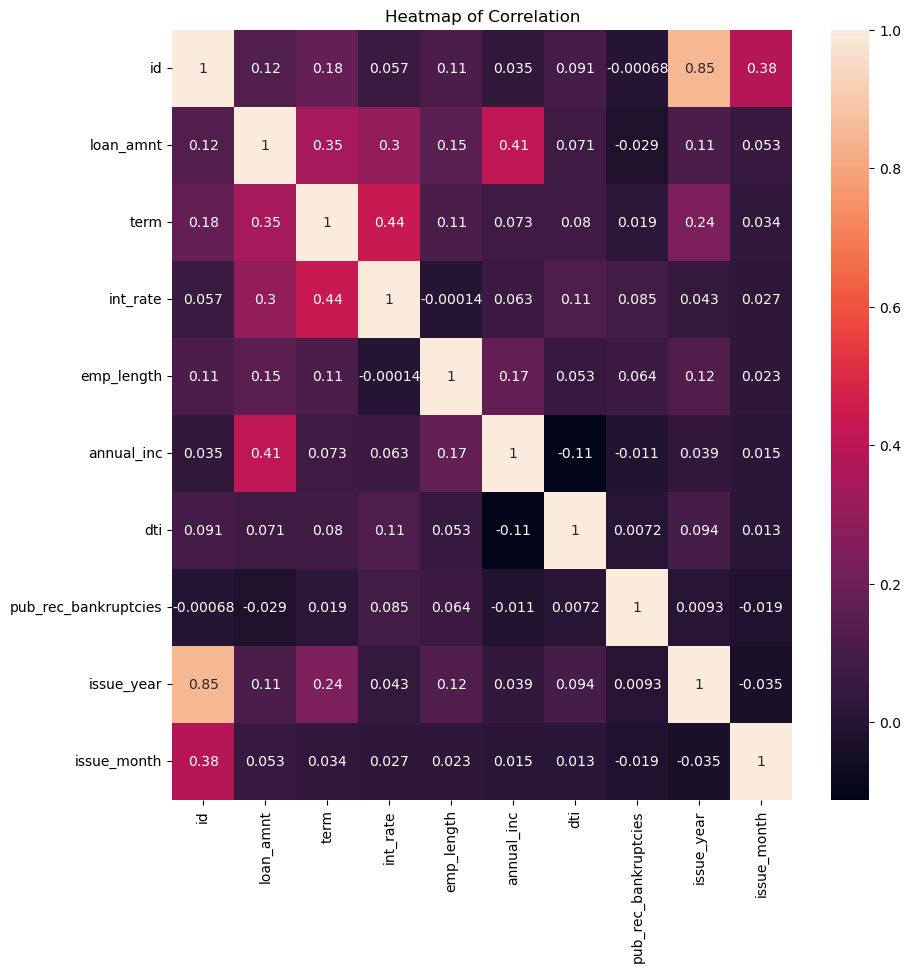

In [723]:
plt.figure(figsize=(10, 10))
sns.heatmap(loan_data.select_dtypes(include=['int64', 'int32', 'float64']).corr(), annot=True)
plt.title('Heatmap of Correlation')
plt.show()

#### Inference - Interest rate and term are highly correlated which means that loans with longer terms tend to have higher interest rates. Annual income and DTI are least correlated which means that a person's income doesn't strongly affect their debt-to-income ratio.


## Conclusions

#### Defaulted loans are significantly fewer than fully paid loans, with 36-month loans being more common and loans predominantly taken by higher-grade borrowers.le.

#### Loans average $9,800 and are mainly for rent, mortgage, and debt consolidation, with interest rates clustering around 7.5% and 10-15%, and longer-term loans having higher rates.


#### Debt consolidation loans show high rates of both full repayment and default, with higher loan amounts and annual incomes around $50,000 being more likely to default.

#### Higher grades (A, B, C) are linked to lower interest rates, while lower grades (D, E, F, G) face higher rates, and most borrowers have no public bankruptcy records, indicating a generally safer profile.

## Recommendations

#### Tighten criteria for 36-month loans due to higher default rates and focus on higher-grade borrowers (A and B) with over 10 years of experience.

#### Monitor and manage interest rates, particularly in the 5-15% range, and offer competitive rates for longer-term loans.

#### Prioritize approving 36-month loans, especially for borrowers seeking debt consolidation or credit card debt relief.

#### Provide financial education to lower-income borrowers, offer better terms for those without public bankruptcy records, and consider work experience and property ownership in loan assessments.